In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly, json
import plotly.express as px
from urllib.request import urlopen
from sklearn.linear_model import LinearRegression
from astropy.modeling import models, fitting
np.seterr(divide='ignore',invalid='ignore')
pd.set_option('display.max_columns', None)

# Only load this if you've already run the last few lines of the next cell (creates allpops_flattened.csv)
all_pops = pd.read_csv('../data/allpops_flattened.csv')

In [2]:
# Get data for specific groups of people (you only want one data point per county when you plot)
mort = pd.read_csv('../data/mort_airq_poverty.csv',dtype={"FIPS": str})
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response: counties = json.load(response)

def flatten_df(df, filter_by = {}, save_fn = None): 
    
    sort_by = {'Gender Code' : None,
               'Race' : None,
               'Hispanic Origin' : None,
               'Interval' : None,
               'Age Group Code': None,
               'State' : None}
    county_level_cols = ['County','5_Year_Avg_Poverty_Estimate','Total 5yrAvg County Population',
                         'Total 5yrAvg County Population','Total 5yrAvg County Deaths',
                         'Total 5yrAvg State Population','Total 5yrAvg State Deaths',
                         'Total 15yrAvg County Population','Total 15yrAvg County Deaths',
                         'Total 15yrAvg State Population','Total 15yrAvg State Deaths','15_Year_Avg_Poverty_Estimate',
                         'CO 2nd Max 1-hr', 'CO 2nd Max 8-hr','NO2 98th Percentile 1-hr', 
                         'NO2 Mean 1-hr', 'Ozone 2nd Max 1-hr', 'Ozone 4th Max 8-hr', 
                         'SO2 99th Percentile 1-hr', 'SO2 2nd Max 24-hr','SO2 Mean 1-hr', 
                         'PM2.5 98th Percentile 24-hr', 'PM2.5 Weighted Mean 24-hr', 
                         'PM10 2nd Max 24-hr', 'Lead Max 3-Mo Avg']
    air_q_cols = ['CO 2nd Max 1-hr', 'CO 2nd Max 8-hr','NO2 98th Percentile 1-hr', 
                  'NO2 Mean 1-hr', 'Ozone 2nd Max 1-hr', 'Ozone 4th Max 8-hr', 
                  'SO2 99th Percentile 1-hr', 'SO2 2nd Max 24-hr','SO2 Mean 1-hr', 
                  'PM2.5 98th Percentile 24-hr', 'PM2.5 Weighted Mean 24-hr', 
                  'PM10 2nd Max 24-hr', 'Lead Max 3-Mo Avg']
    
    # Check for bad input
    for key in filter_by.keys(): 
        if key not in sort_by: 
            print('Unrecognized key in filter_by dict.')
            return
    
    for key in filter_by:
        if filter_by[key] != None: sort_by[key] = filter_by[key]
    
    # Deal with interval issues
    temp_df = df.copy(deep=True)
    if sort_by['Interval'] != None: 
        num_years = 5
        mask = np.asarray(temp_df['Interval']==sort_by['Interval'])
        temp_df = temp_df.loc[mask]
        
    else: 
        num_years = 15
        fips = np.unique(temp_df['FIPS'].astype(str))
        for fip in fips:
            temp = temp_df.loc[temp_df['FIPS']==fip]
            all_ints,ind = np.unique(temp['Interval'],return_index=True)
            for quant in air_q_cols:
                mask = temp_df['FIPS'] == fip
                temp_df.loc[mask,quant] = np.nanmean(temp.iloc[ind][quant])

    # Remove all unnecesary data from the df
    for key,val in sort_by.items():
        if val == None: 
            temp_df = temp_df.drop(columns=key)
        else:    
            temp_df = temp_df.loc[np.asarray(temp_df[key]==val)]
            
    # Flatten remaining data points so that there are no repeated counties/FIPS
    fips,ind = np.unique(temp_df['FIPS'].astype(str),return_index=True)
    
    ### Get values that are constant for different groups in the same county
    county_levels = {}
    for col in county_level_cols:
        county_levels[col] = np.asarray(temp_df[col])[ind]
        
    ### Calculate the values that change with different groups in the same county
    deaths = []
    population = []
    for fip in fips:
        mask = np.asarray(temp_df['FIPS']==fip)
        single_county_df = temp_df.loc[mask]
        deaths.append(np.sum(single_county_df['Deaths']))
        population.append(np.sum(single_county_df['Population']))
    
    ### Calculate deaths and population per year
    deaths = np.asarray(deaths)/num_years
    population = np.asarray(population)/num_years
    
    # Construct dataframe
    flattened_df = pd.DataFrame(data={'FIPS': fips, 'Deaths': deaths, 'Population': population})
    for col in county_level_cols:
        if sort_by['Interval'] != None:
            flattened_df[col] = county_levels[col]
        elif ' 5yrAvg' not in col and '5_Year_Avg_Poverty_Estimate' != col:
            flattened_df[col] = county_levels[col]
    
    # Save to CSV if necessary
    if save_fn != None:
        flattened_df.to_csv(save_fn)
    
    return flattened_df # dataframe with single row for each county containing deaths, population, poverty, and polution
mort

# This will take a while to run. If you've done it once just load the saved CSV
#all_pops = flatten_df(mort,save_fn = '../data/allpops_flattened.csv')
#all_pops

,Unnamed: 0,County,Age Group Code,Gender Code,Race,Hispanic Origin,Deaths,Population,Crude Rate,2012-2016,2007-2011,2002-2006,State,Unreliable,FIPS,5_Year_Avg_Poverty_Estimate,Interval,Total 5yrAvg County Population,Total 5yrAvg County Deaths,Total 5yrAvg State Population,Total 5yrAvg State Deaths,Total 15yrAvg County Population,Total 15yrAvg County Deaths,Total 15yrAvg State Population,Total 15yrAvg State Deaths,15_Year_Avg_Poverty_Estimate,CO 2nd Max 1-hr,CO 2nd Max 8-hr,NO2 98th Percentile 1-hr,NO2 Mean 1-hr,Ozone 2nd Max 1-hr,Ozone 4th Max 8-hr,SO2 99th Percentile 1-hr,SO2 2nd Max 24-hr,SO2 Mean 1-hr,PM2.5 98th Percentile 24-hr,PM2.5 Weighted Mean 24-hr,PM10 2nd Max 24-hr,Lead Max 3-Mo Avg
0,0,"Autauga County, AL",NS,F,White,Hispanic or Latino,NaN,NaN,NaN,1.0,0.0,0.0,AL,True,01001,7205.6,2012-2016,34145.0,495.4,3436910.2,49531.2,32042.933333,436.133333,3.353935e+06,47131.000000,6151.066667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,"Autauga County, AL",NS,F,White,Not Hispanic or Latino,NaN,NaN,NaN,1.0,0.0,0.0,AL,True,01001,7205.6,2012-2016,34145.0,495.4,3436910.2,49531.2,32042.933333,436.133333,3.353935e+06,47131.000000,6151.066667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,"Autauga County, AL",NS,F,White,Not Stated,NaN,NaN,NaN,1.0,0.0,0.0,AL,True,01001,7205.6,2012-2016,34145.0,495.4,3436910.2,49531.2,32042.933333,436.133333,3.353935e+06,47131.000000,6151.066667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,"Autauga County, AL",NS,F,White,NaN,NaN,NaN,NaN,1.0,0.0,0.0,AL,True,01001,7205.6,2012-2016,34145.0,495.4,3436910.2,49531.2,32042.933333,436.133333,3.353935e+06,47131.000000,6151.066667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,"Autauga County, AL",NS,F,NaN,NaN,NaN,NaN,NaN,1.0,0.0,0.0,AL,True,01001,7205.6,2012-2016,34145.0,495.4,3436910.2,49531.2,32042.933333,436.133333,3.353935e+06,47131.000000,6151.066667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
401384,401384,"Rock County, WI",65-74,F,Black or African American,Not Hispanic or Latino,22.0,969.0,2270.4,0.0,1.0,0.0,WI,False,55105,19918.8,2007-2011,107559.2,1309.8,3944774.8,45689.8,110384.866667,1357.733333,3.972241e+06,46671.933333,18703.600000,NaN,NaN,NaN,NaN,-36.666667,-1.714286,NaN,NaN,NaN,NaN,NaN,NaN,NaN
401385,401385,"Rock County, WI",75-84,F,Black or African American,Not Hispanic or Latino,29.0,584.0,4965.8,0.0,1.0,0.0,WI,False,55105,19918.8,2007-2011,107559.2,1309.8,3944774.8,45689.8,110384.866667,1357.733333,3.972241e+06,46671.933333,18703.600000,NaN,NaN,NaN,NaN,-36.666667,-1.714286,NaN,NaN,NaN,NaN,NaN,NaN,NaN
401386,401386,"Rock County, WI",85+,F,Black or African American,Not Hispanic or Latino,38.0,261.0,14559.4,0.0,1.0,0.0,WI,False,55105,19918.8,2007-2011,107559.2,1309.8,3944774.8,45689.8,110384.866667,1357.733333,3.972241e+06,46671.933333,18703.600000,NaN,NaN,NaN,NaN,-36.666667,-1.714286,NaN,NaN,NaN,NaN,NaN,NaN,NaN
401387,401387,"Waukesha County, WI",75-84,F,Black or African American,Not Hispanic or Latino,13.0,191.0,6806.3,0.0,1.0,0.0,WI,True,55133,18804.0,2007-2011,293637.6,2910.4,3944774.8,45689.8,292739.866667,2980.200000,3.972241e+06,46671.933333,18211.266667,NaN,NaN,NaN,NaN,-35.000000,-7.142857,NaN,NaN,NaN,-10.285714,5.0,-66.933333,NaN


In [17]:
all_pops['Poverty Rate'] = np.asarray(all_pops['15_Year_Avg_Poverty_Estimate'])/np.asarray(all_pops['Population'])
all_pops['Death Rate'] = np.asarray(all_pops['Deaths'])/np.asarray(all_pops['Population'])
all_pops['Log Population'] = np.log10(all_pops['Population'])

/Users/kirstencasey/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning:

invalid value encountered in true_divide

/Users/kirstencasey/opt/anaconda3/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning:

divide by zero encountered in log10



In [120]:
col = 'Lead Max 3-Mo Avg'

fig = px.choropleth(all_pops, geojson=counties, locations='FIPS', color=col,
                           color_continuous_scale="Viridis",
                           scope="usa",
                           range_color=(-50, 70),
                           labels={col:''}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

### By Interval

Text(0, 0.5, '$log_{10}$(death rate)')

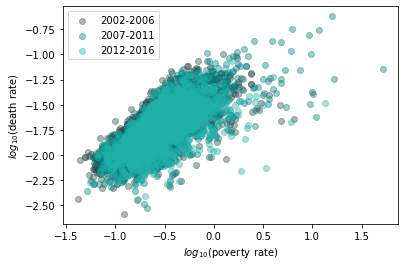

In [4]:
plt.clf()
colors = ['darkslategrey','teal','lightseagreen']
intervals = ['2002-2006','2007-2011','2012-2016']
i=0
for interval in intervals:
    flattened = flatten_df(mort,{'Interval':interval})
    flattened['Poverty Rate'] = np.asarray(flattened['5_Year_Avg_Poverty_Estimate'])/np.asarray(flattened['Total 5yrAvg County Population'])
    flattened['Death Rate'] = np.asarray(flattened['Deaths'])/np.asarray(flattened['Total 5yrAvg County Population'])
    log_poverty = np.log10(flattened['Poverty Rate'])
    log_deaths = np.log10(flattened['Death Rate'])
    
    plt.scatter(log_poverty,log_deaths,c=colors[i],label=interval,alpha=0.4)
    
    i+=1

plt.legend()
plt.xlabel('$log_{10}$(poverty rate)')
plt.ylabel('$log_{10}$(death rate)')

### By Race

<Figure size 432x288 with 0 Axes>

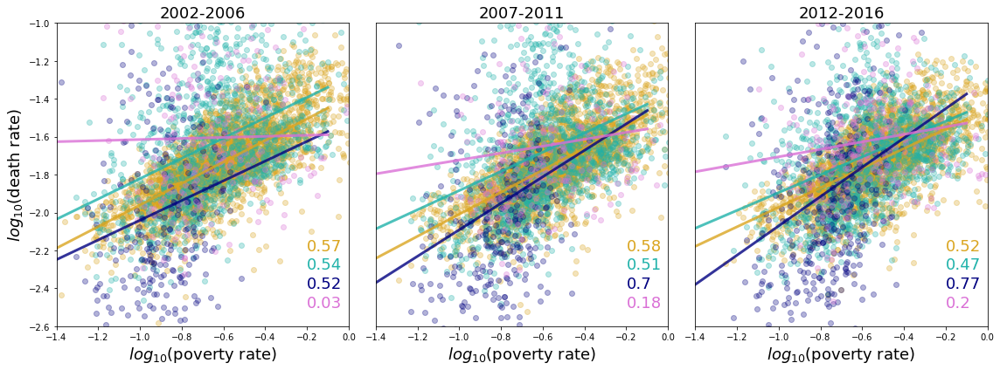

In [109]:
plt.clf()
fig,ax = plt.subplots(1,3,figsize=(16,6))
races = ['White','Black or African American','Asian or Pacific Islander','American Indian or Alaska Native']
colors = ['goldenrod','lightseagreen','navy','orchid']
intervals = ['2002-2006','2007-2011','2012-2016']
i=0

for interval in intervals:
    c=0
    for race in races:

        flattened = flatten_df(mort,{'Race':race,'Interval':interval})
        flattened['Poverty Rate'] = np.asarray(flattened['5_Year_Avg_Poverty_Estimate'])/np.asarray(flattened['Total 5yrAvg County Population'])
        flattened['Death Rate'] = np.asarray(flattened['Deaths'])/np.asarray(flattened['Population'])
        log_poverty = np.asarray(np.log10(flattened['Poverty Rate']))
        log_deaths = np.asarray(np.log10(flattened['Death Rate']))
        

        mask = pd.notnull(log_poverty)
        mask &= pd.notnull(log_deaths)
        mask &= ~np.isinf(log_deaths)
        mask &= ~np.isinf(log_poverty)

        log_poverty = log_poverty[mask]
        log_deaths = log_deaths[mask]

        ax[i].scatter(log_poverty,log_deaths,c=colors[c],label=race,alpha=0.3)
        poly_linear = np.polyfit(log_poverty,log_deaths,1)
        #print(r)
        xfit = np.arange(-1.4,0,0.1)
        p = np.poly1d(poly_linear)

        ax[i].plot(xfit,p(xfit),color=colors[c],alpha=0.8,lw=3)
        
        if i == 0: ax[i].set_ylabel('$log_{10}$(death rate)',fontsize=18)
        else: ax[i].get_yaxis().set_visible(False)
        ax[i].set_xlabel('$log_{10}$(poverty rate)',fontsize=18)
        ax[i].set_xlim(-1.4,0)
        ax[i].set_ylim(-2.6,-1)
        ax[i].set_title(interval,fontsize=18)
        ax[i].text(-0.2,-2.2-0.1*c,f'{round(p[1],2)}',color=colors[c],fontsize=18)
        c+=1
    i+=1
plt.tight_layout()
#plt.legend()

<Figure size 432x288 with 0 Axes>

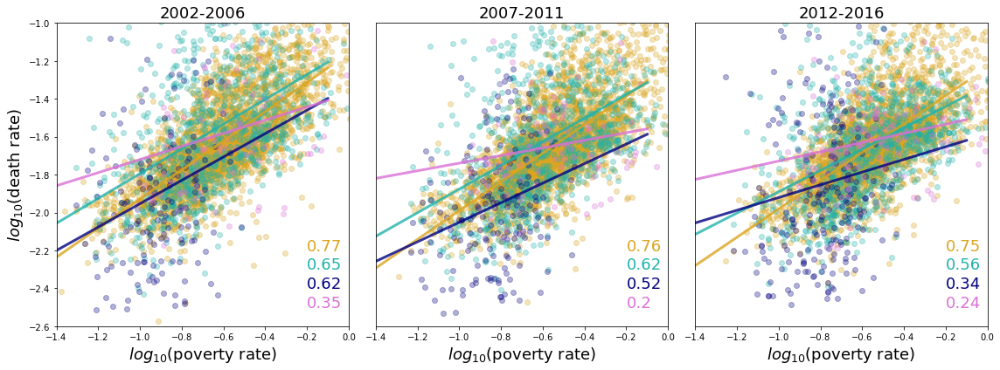

In [108]:
# Filter out unreliable values
unreliable_mask = mort['Unreliable']==False
filtered_mort = mort.loc[unreliable_mask]

from astropy.modeling import models, fitting
plt.clf()
fig,ax = plt.subplots(1,3,figsize=(16,6))
races = ['White','Black or African American','Asian or Pacific Islander','American Indian or Alaska Native']
colors = ['goldenrod','lightseagreen','navy','orchid']
i=0
results = {}
for interval in intervals:
    results[interval] = {}
    for race in races:
        results[interval][race] = {}

for interval in intervals:
    c=0
    for race in races:

        flattened = flatten_df(filtered_mort,{'Race':race,'Interval':interval})
        flattened['Poverty Rate'] = np.asarray(flattened['5_Year_Avg_Poverty_Estimate'])/np.asarray(flattened['Total 5yrAvg County Population'])
        flattened['Death Rate'] = np.asarray(flattened['Deaths'])/np.asarray(flattened['Population'])
        log_poverty = np.asarray(np.log10(flattened['Poverty Rate']))
        log_deaths = np.asarray(np.log10(flattened['Death Rate']))
        

        mask = pd.notnull(log_poverty)
        mask &= pd.notnull(log_deaths)
        mask &= ~np.isinf(log_deaths)
        mask &= ~np.isinf(log_poverty)

        log_poverty = log_poverty[mask]
        log_deaths = log_deaths[mask]
        results[interval][race]['deaths'] = log_deaths
        results[interval][race]['poverty'] = log_poverty

        ax[i].scatter(log_poverty,log_deaths,c=colors[c],alpha=0.3)
        poly_linear = np.polyfit(log_poverty,log_deaths,1)
        xfit = np.arange(-1.4,0,0.1)
        p = np.poly1d(poly_linear)
        results[interval][race]['linearfit'] = p

        ax[i].plot(xfit,p(xfit),color=colors[c],alpha=0.8,lw=3)
        
        if i == 0: ax[i].set_ylabel('$log_{10}$(death rate)',fontsize=18)
        else: ax[i].get_yaxis().set_visible(False)
        ax[i].set_xlabel('$log_{10}$(poverty rate)',fontsize=18)
        ax[i].set_xlim(-1.4,0)
        ax[i].set_ylim(-2.6,-1)
        ax[i].set_title(interval,fontsize=18)
        ax[i].text(-0.2,-2.2-0.1*c,f'{round(p[1],2)}',color=colors[c],fontsize=18)
        c+=1
    i+=1
plt.tight_layout()
#plt.legend()

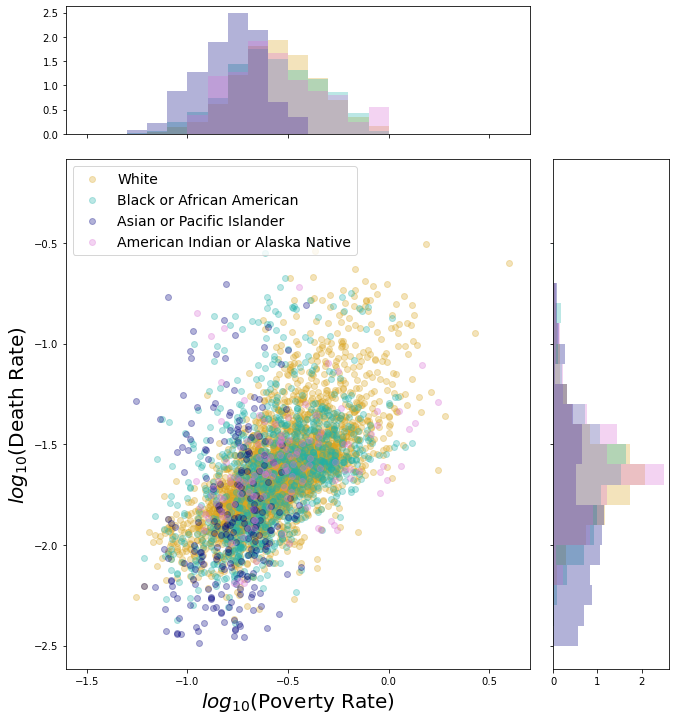

In [58]:
# These plots use code modified from here: https://matplotlib.org/stable/gallery/lines_bars_and_markers/scatter_hist.html

def scatter_hist(x, y, ax, ax_histx, ax_histy, color='k', label=None):
    # no labels
    ax_histx.tick_params(axis="x", labelbottom=False)
    ax_histy.tick_params(axis="y", labelleft=False)

    # the scatter plot:
    ax.scatter(x, y, alpha=0.3, color=color, label=label)

    # now determine nice limits by hand:
    binwidth = 0.1
    binsx = np.arange(-1.5, 0 + binwidth, binwidth)
    binsy = np.arange(-2.5, -0.25 + binwidth, binwidth)
    ax_histx.hist(x, bins=binsx, alpha=0.3, color=color,density=True)
    ax_histy.hist(y, bins=binsy, orientation='horizontal', alpha=0.3, color=color,density=True)

interval = '2012-2016'
# Create a Figure, which doesn't have to be square.
fig = plt.figure(constrained_layout=True,figsize=(10,10))
# Create the main axes, leaving 25% of the figure space at the top and on the
# right to position marginals.
ax = fig.add_gridspec(top=0.75, right=0.75).subplots()
# The main axes' aspect can be fixed.
ax.set(aspect=1)
# Create marginal axes, which have 25% of the size of the main axes.  Note that
# the inset axes are positioned *outside* (on the right and the top) of the
# main axes, by specifying axes coordinates greater than 1.  Axes coordinates
# less than 0 would likewise specify positions on the left and the bottom of
# the main axes.
ax_histx = ax.inset_axes([0, 1.05, 1, 0.25], sharex=ax)
ax_histy = ax.inset_axes([1.05, 0, 0.25, 1], sharey=ax)
# Draw the scatter plot and marginals.
for race,color in zip(races,colors):
    x = results[interval][race]['poverty']
    y = results[interval][race]['deaths']
    scatter_hist(x, y, ax, ax_histx, ax_histy, color,race)
ax.legend(fontsize=14)
ax.set_xlabel('$log_{10}$(Poverty Rate)',fontsize=20)
ax.set_ylabel('$log_{10}$(Death Rate)',fontsize=20)
plt.show()

### By Age Group

<Figure size 432x288 with 0 Axes>

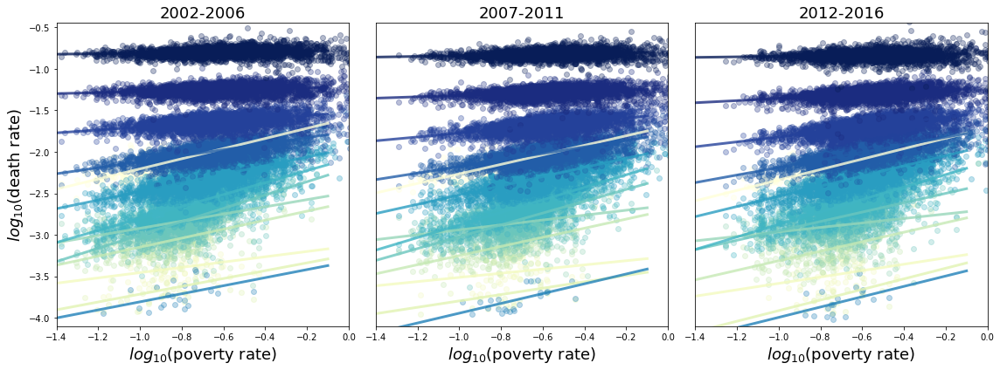

In [82]:
# Filter out unreliable values
plt.clf()
fig,ax = plt.subplots(1,3,figsize=(16,6))
age_groups = np.unique(filtered_mort['Age Group Code'])
colors = ['lightgoldenrodyellow','palegoldenrod','goldenrod','paleturquoise','lightgreen','springgreen','aquamarine','mediumaquamarine','turquoise','lightseagreen','teal','darkslategrey','black']
cmap = plt.get_cmap('YlGnBu')
norm = plt.Normalize(0, 12)

i=0
age_results = {}
for interval in intervals:
    age_results[interval] = {}
    for age in age_groups:
        age_results[interval][age] = {}

for interval in intervals:
    c=0
    for age in age_groups:

        flattened = flatten_df(filtered_mort,{'Age Group Code':age,'Interval':interval})
        flattened['Poverty Rate'] = np.asarray(flattened['5_Year_Avg_Poverty_Estimate'])/np.asarray(flattened['Total 5yrAvg County Population'])
        flattened['Death Rate'] = np.asarray(flattened['Deaths'])/np.asarray(flattened['Population'])
        log_poverty = np.asarray(np.log10(flattened['Poverty Rate']))
        log_deaths = np.asarray(np.log10(flattened['Death Rate']))
        

        mask = pd.notnull(log_poverty)
        mask &= pd.notnull(log_deaths)
        mask &= ~np.isinf(log_deaths)
        mask &= ~np.isinf(log_poverty)

        log_poverty = log_poverty[mask]
        log_deaths = log_deaths[mask]
        age_results[interval][age]['deaths'] = log_deaths
        age_results[interval][age]['poverty'] = log_poverty

        ax[i].scatter(log_poverty,log_deaths,color=cmap(norm(c)),label=age,alpha=0.3)
        poly_linear = np.polyfit(log_poverty,log_deaths,1)
        xfit = np.arange(-1.4,0,0.1)
        p = np.poly1d(poly_linear)
        age_results[interval][age]['linearfit'] = p

        ax[i].plot(xfit,p(xfit),color=cmap(norm(c)),alpha=0.8,lw=3)
        
        if i == 0: ax[i].set_ylabel('$log_{10}$(death rate)',fontsize=18)
        else: ax[i].get_yaxis().set_visible(False)
        ax[i].set_xlabel('$log_{10}$(poverty rate)',fontsize=18)
        ax[i].set_xlim(-1.4,0)
        ax[i].set_ylim(-4.1,-0.45)
        ax[i].set_title(interval,fontsize=18)
        c+=1
    i+=1
plt.tight_layout()
#plt.legend(loc='upper center',ncol=7,fontsize=18,bbox_to_anchor=(0, -0.5))

<Figure size 432x288 with 0 Axes>

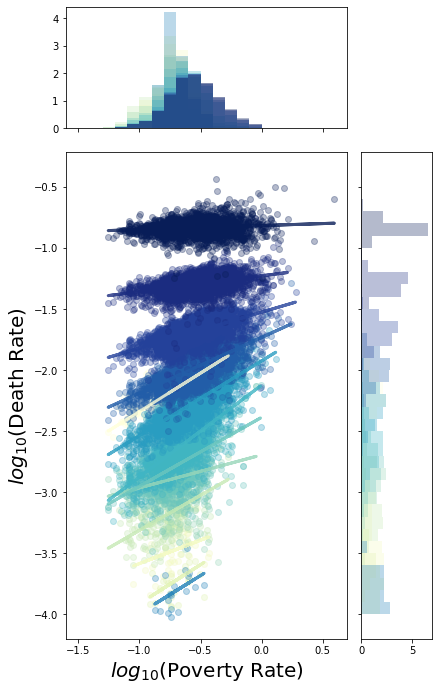

In [119]:
plt.clf()
def scatter_hist(x, y, ax, ax_histx, ax_histy, color='k', label=None):
    # no labels
    ax_histx.tick_params(axis="x", labelbottom=False)
    ax_histy.tick_params(axis="y", labelleft=False)

    # the scatter plot:
    ax.scatter(x, y, alpha=0.3, color=color, label=label)

    # now determine nice limits by hand:
    binwidth = 0.1
    binsx = np.arange(-1.5, 0 + binwidth, binwidth)
    binsy = np.arange(-4, -0.4 + binwidth, binwidth)
    ax_histx.hist(x, bins=binsx, alpha=0.3, color=color,density=True)
    ax_histy.hist(y, bins=binsy, orientation='horizontal', alpha=0.3, color=color,density=True)

interval = '2012-2016'
# Create a Figure, which doesn't have to be square.
fig = plt.figure(constrained_layout=True,figsize=(6,20))
# Create the main axes, leaving 25% of the figure space at the top and on the
# right to position marginals.
ax = fig.add_gridspec(top=0.75, right=0.75).subplots()
# The main axes' aspect can be fixed.
ax.set(aspect=1)
# Create marginal axes, which have 25% of the size of the main axes.  Note that
# the inset axes are positioned *outside* (on the right and the top) of the
# main axes, by specifying axes coordinates greater than 1.  Axes coordinates
# less than 0 would likewise specify positions on the left and the bottom of
# the main axes.
ax_histx = ax.inset_axes([0, 1.05, 1, 0.25], sharex=ax)
ax_histy = ax.inset_axes([1.05, 0, 0.25, 1], sharey=ax)
# Draw the scatter plot and marginals.
c=0
for age in age_groups:
    x = age_results[interval][age]['poverty']
    y = age_results[interval][age]['deaths']
    p = age_results[interval][age]['linearfit']
    label=age
    if age=='1': label='<1'
    scatter_hist(x, y, ax, ax_histx, ax_histy, cmap(norm(c)), label=f'{label}: {round(p[1],2)}')
    ax.plot(x,p(x),color=cmap(norm(c)),alpha=0.8,lw=3)
    #ax.text(-0.8,age_results[interval][age]['linearfit'](x)[0],age,fontsize=16,color='firebrick')
    c+=1
#ax.legend(fontsize=14,bbox_to_anchor=(1.5,1))
ax.set_xlabel('$log_{10}$(Poverty Rate)',fontsize=20)
ax.set_ylabel('$log_{10}$(Death Rate)',fontsize=20)
plt.show()

### Gender 

<Figure size 432x288 with 0 Axes>

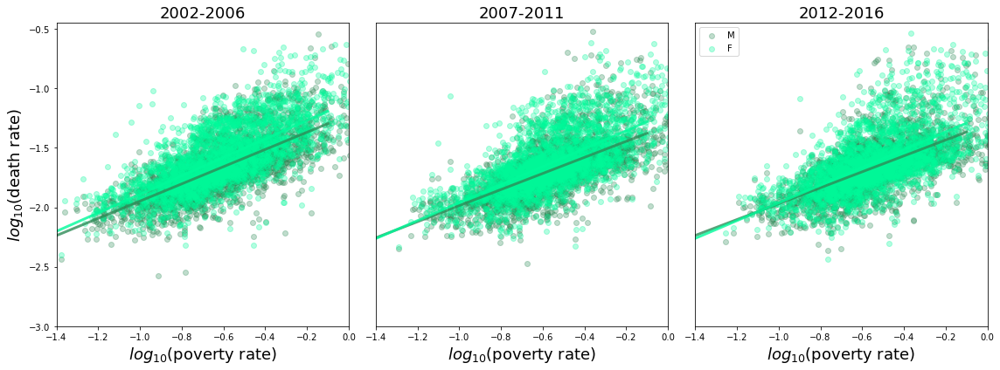

In [85]:
# Filter out unreliable values
plt.clf()
fig,ax = plt.subplots(1,3,figsize=(16,6))
genders = ['M','F']
colors = ['seagreen','mediumspringgreen']

i=0
gender_results = {}
for interval in intervals:
    gender_results[interval] = {}
    for gender in genders:
        gender_results[interval][gender] = {}

for interval in intervals:
    c=0
    for gender in genders:

        flattened = flatten_df(filtered_mort,{'Gender Code':gender,'Interval':interval})
        flattened['Poverty Rate'] = np.asarray(flattened['5_Year_Avg_Poverty_Estimate'])/np.asarray(flattened['Total 5yrAvg County Population'])
        flattened['Death Rate'] = np.asarray(flattened['Deaths'])/np.asarray(flattened['Population'])
        log_poverty = np.asarray(np.log10(flattened['Poverty Rate']))
        log_deaths = np.asarray(np.log10(flattened['Death Rate']))
        

        mask = pd.notnull(log_poverty)
        mask &= pd.notnull(log_deaths)
        mask &= ~np.isinf(log_deaths)
        mask &= ~np.isinf(log_poverty)

        log_poverty = log_poverty[mask]
        log_deaths = log_deaths[mask]
        gender_results[interval][gender]['deaths'] = log_deaths
        gender_results[interval][gender]['poverty'] = log_poverty

        ax[i].scatter(log_poverty,log_deaths,color=colors[c],label=gender,alpha=0.3)
        poly_linear = np.polyfit(log_poverty,log_deaths,1)
        xfit = np.arange(-1.4,0,0.1)
        p = np.poly1d(poly_linear)
        gender_results[interval][gender]['linearfit'] = p

        ax[i].plot(xfit,p(xfit),color=colors[c],alpha=0.8,lw=3)
        
        if i == 0: ax[i].set_ylabel('$log_{10}$(death rate)',fontsize=18)
        else: ax[i].get_yaxis().set_visible(False)
        ax[i].set_xlabel('$log_{10}$(poverty rate)',fontsize=18)
        ax[i].set_xlim(-1.4,0)
        ax[i].set_ylim(-3,-0.45)
        ax[i].set_title(interval,fontsize=18)
        c+=1
    i+=1
plt.tight_layout()
plt.legend()

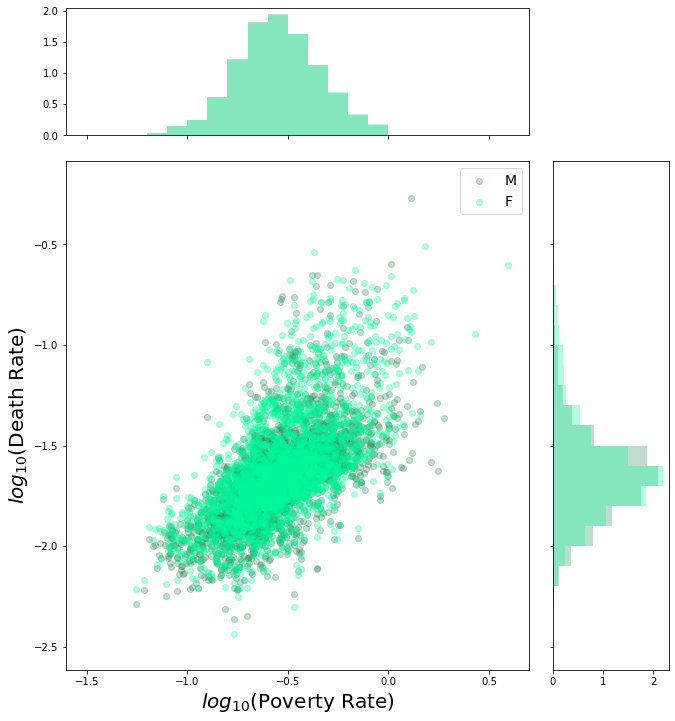

In [86]:
def scatter_hist(x, y, ax, ax_histx, ax_histy, color='k', label=None):
    # no labels
    ax_histx.tick_params(axis="x", labelbottom=False)
    ax_histy.tick_params(axis="y", labelleft=False)

    # the scatter plot:
    ax.scatter(x, y, alpha=0.3, color=color, label=label)

    # now determine nice limits by hand:
    binwidth = 0.1
    binsx = np.arange(-1.5, 0 + binwidth, binwidth)
    binsy = np.arange(-2.5, -0.25 + binwidth, binwidth)
    ax_histx.hist(x, bins=binsx, alpha=0.3, color=color,density=True)
    ax_histy.hist(y, bins=binsy, orientation='horizontal', alpha=0.3, color=color,density=True)

interval = '2012-2016'
# Create a Figure, which doesn't have to be square.
fig = plt.figure(constrained_layout=True,figsize=(10,10))
# Create the main axes, leaving 25% of the figure space at the top and on the
# right to position marginals.
ax = fig.add_gridspec(top=0.75, right=0.75).subplots()
# The main axes' aspect can be fixed.
ax.set(aspect=1)
# Create marginal axes, which have 25% of the size of the main axes.  Note that
# the inset axes are positioned *outside* (on the right and the top) of the
# main axes, by specifying axes coordinates greater than 1.  Axes coordinates
# less than 0 would likewise specify positions on the left and the bottom of
# the main axes.
ax_histx = ax.inset_axes([0, 1.05, 1, 0.25], sharex=ax)
ax_histy = ax.inset_axes([1.05, 0, 0.25, 1], sharey=ax)
# Draw the scatter plot and marginals.
for gender,color in zip(genders,colors):
    x = gender_results[interval][gender]['poverty']
    y = gender_results[interval][gender]['deaths']
    scatter_hist(x, y, ax, ax_histx, ax_histy, color,gender)
ax.legend(fontsize=14)
ax.set_xlabel('$log_{10}$(Poverty Rate)',fontsize=20)
ax.set_ylabel('$log_{10}$(Death Rate)',fontsize=20)
plt.show()